# Predicting the Number of High PM2.5 Levels for Cities in China

# Table of Contents:
1. [Summary of Notebook](#Summary)
2. [Environment Setup](#env_setup)
3. [Data Loading](#load)
4. [Handling Outliers](#outliers)
5. [Feature Engineer](#feature_eng)
6. [Removing Missing Values](#missing_values)
7. [Averaging Process Validation](#avg_validation)
8. [Save Data](#save_data)


## Summary of Notebook <a id='Summary'></a>

**Project Background**: PM2.5 stands for particular matter; tiny particles in the air usually with diameters around 2.5 micrometers or smaller. They can affect the respiratory and cardiovascular systems, and is associated with multiple diseases such as lung cancer and chronic bronchitis. It also can worsen the symptoms of patients with respiratory allergies. Sources of PM2.5 are: vehicles exhausts, burning fuels operations, power plants, and natural causes such as forest fires and volcanos. 

**Project Goal**: Five datasets for five cities in China are given: Beijing, Chengdu, Guangzhou, Shanghai, Shenyang. In each dataset there is the hourly PM levels reported by $3$ or $4$ stations, and other meteorological measurements such as temperature, pressure, etc. The goal is to predict the number of days that are high for PM2.5 levels averaged over the course of each calendar month for each city from the datasets that we currently have.

**Methods**: Dataset contains five datasets for five cities in China. Outliers were removed. Feature engineeing was performed by averaging the hours and different stations to a daily value. Train set was chosen from $2010$ till $2014$, and test set is $2015$. A PM level of 55 or larger is considered large in this analysis. The label was created by counting the number of days that have a PM level equal or greater than 55 for the next 30 days. The prediction is generated from multiple features at one timestamp.

## Environment Setup <a id='env_setup'></a>

In [1]:
%load_ext autoreload
%autoreload 2

Libraries

In [2]:
import os
import sys
import math
import copy
import pickle
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np

List of directories

In [3]:
DIRECTORY_DATA = '../data/external/'

DIRECTORY_INTER = '../data/inter/'

In [4]:
if '../src' not in sys.path:
    sys.path.append('../src')
    
import utils

Global variables

In [5]:
CITY_DICT_NO_NA_FILENAME = "city_dict_no_na.pkl"

## Data Loading <a id='load'></a>

In [6]:
city_dict = {file.split('_')[0]: pd.read_csv(os.path.join(DIRECTORY_DATA,file)) for file in os.listdir(DIRECTORY_DATA)}  

Current columns for each city:

No: row number.\
year: year of data in this row.\
month: month of data in this row.\
day: day of data in this row.\
hour: hour of data in this row.\
season: season of data in this row.\
PM: PM2.5 concentration (ug/m^3).\
DEWP: Dew Point (Celsius Degree).\
TEMP: Temperature (Celsius Degree).\
HUMI: Humidity (%).\
PRES: Pressure (hPa).\
cbwd: Combined wind direction.\
Iws: Cumulated wind speed (m/s).\
precipitation: hourly precipitation (mm).\
Iprec: Cumulated precipitation (mm).

Information about Beijing

In [7]:
city_dict['beijing'].head()

,No,year,month,day,hour,season,PM_Dongsi,PM_Dongsihuan,PM_Nongzhanguan,PM_US Post,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4,NaN,NaN,NaN,NaN,-21.0,43.0,1021.0,-11.0,NW,1.79,0.0,0.0
1,2,2010,1,1,1,4,NaN,NaN,NaN,NaN,-21.0,47.0,1020.0,-12.0,NW,4.92,0.0,0.0
2,3,2010,1,1,2,4,NaN,NaN,NaN,NaN,-21.0,43.0,1019.0,-11.0,NW,6.71,0.0,0.0
3,4,2010,1,1,3,4,NaN,NaN,NaN,NaN,-21.0,55.0,1019.0,-14.0,NW,9.84,0.0,0.0
4,5,2010,1,1,4,4,NaN,NaN,NaN,NaN,-20.0,51.0,1018.0,-12.0,NW,12.97,0.0,0.0


In [8]:
city_dict['beijing'].describe()

,No,year,month,day,hour,season,PM_Dongsi,PM_Dongsihuan,PM_Nongzhanguan,PM_US Post,DEWP,HUMI,PRES,TEMP,Iws,precipitation,Iprec
count,52584.000000,52584.000000,52584.000000,52584.000000,52584.000000,52584.000000,25052.000000,20508.000000,24931.000000,50387.000000,52579.000000,52245.000000,52245.000000,52579.000000,52579.000000,52100.000000,52100.000000
mean,26292.500000,2012.499772,6.523962,15.726609,11.500000,2.491100,89.154439,92.560806,88.643737,95.904241,2.074554,54.602421,1016.465442,12.587040,23.261829,19.258683,19.519008
std,15179.837614,1.707485,3.448452,8.798896,6.922252,1.116988,87.239267,88.027434,88.041166,91.643772,14.222059,25.991338,10.295070,12.098527,49.281706,4381.035532,4381.036040
min,1.000000,2010.000000,1.000000,1.000000,0.000000,1.000000,3.000000,3.000000,3.000000,1.000000,-40.000000,2.000000,991.000000,-19.000000,0.450000,0.000000,0.000000
25%,13146.750000,2011.000000,4.000000,8.000000,5.750000,1.000000,24.000000,28.000000,24.000000,27.000000,-10.000000,31.000000,1008.000000,2.000000,1.790000,0.000000,0.000000
50%,26292.500000,2012.000000,7.000000,16.000000,11.500000,2.000000,64.000000,68.000000,62.000000,69.000000,2.000000,55.000000,1016.000000,14.000000,4.920000,0.000000,0.000000
75%,39438.250000,2014.000000,10.000000,23.000000,17.250000,3.000000,124.000000,127.000000,122.000000,132.000000,15.000000,78.000000,1025.000000,23.000000,21.020000,0.000000,0.000000
max,52584.000000,2015.000000,12.000000,31.000000,23.000000,4.000000,737.000000,672.000000,844.000000,994.000000,28.000000,100.000000,1046.000000,42.000000,585.600000,999990.000000,999990.000000


In [9]:
city_dict['beijing'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52584 entries, 0 to 52583
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   No               52584 non-null  int64  
 1   year             52584 non-null  int64  
 2   month            52584 non-null  int64  
 3   day              52584 non-null  int64  
 4   hour             52584 non-null  int64  
 5   season           52584 non-null  int64  
 6   PM_Dongsi        25052 non-null  float64
 7   PM_Dongsihuan    20508 non-null  float64
 8   PM_Nongzhanguan  24931 non-null  float64
 9   PM_US Post       50387 non-null  float64
 10  DEWP             52579 non-null  float64
 11  HUMI             52245 non-null  float64
 12  PRES             52245 non-null  float64
 13  TEMP             52579 non-null  float64
 14  cbwd             52579 non-null  object 
 15  Iws              52579 non-null  float64
 16  precipitation    52100 non-null  float64
 17  Iprec       

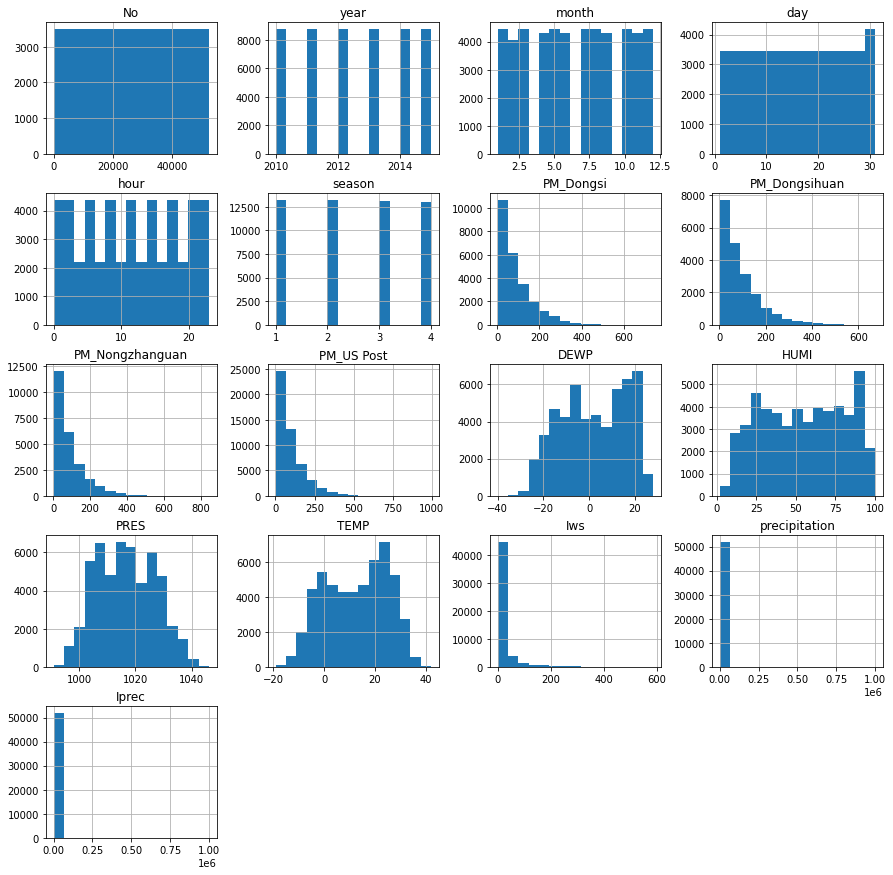

In [10]:
city_dict['beijing'].hist(bins=15,figsize=(15,15))
plt.show()

Information about Shanghai

In [11]:
city_dict['shanghai'].head()

,No,year,month,day,hour,season,PM_Jingan,PM_US Post,PM_Xuhui,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4,NaN,NaN,NaN,-6.0,59.48,1026.1,1.0,cv,1.0,0.0,0.0
1,2,2010,1,1,1,4,NaN,NaN,NaN,-6.0,59.48,1025.1,1.0,SE,2.0,0.0,0.0
2,3,2010,1,1,2,4,NaN,NaN,NaN,-7.0,59.21,1025.1,0.0,SE,4.0,0.0,0.0
3,4,2010,1,1,3,4,NaN,NaN,NaN,-6.0,63.94,1024.0,0.0,SE,5.0,0.0,0.0
4,5,2010,1,1,4,4,NaN,NaN,NaN,-6.0,63.94,1023.0,0.0,SE,8.0,0.0,0.0


In [12]:
city_dict['shanghai'].describe()

,No,year,month,day,hour,season,PM_Jingan,PM_US Post,PM_Xuhui,DEWP,HUMI,PRES,TEMP,Iws,precipitation,Iprec
count,52584.000000,52584.000000,52584.000000,52584.000000,52584.000000,52584.000000,24700.000000,34039.000000,25189.000000,52571.000000,52571.000000,52556.000000,52571.000000,52572.000000,48575.000000,48575.000000
mean,26292.500000,2012.499772,6.523962,15.726609,11.500000,2.491100,57.395992,52.910544,57.678987,11.295372,69.545646,1016.017564,17.471115,49.602367,0.142001,0.935362
std,15179.837614,1.707485,3.448452,8.798896,6.922252,1.116988,47.616179,42.576138,48.412620,9.877649,17.658942,9.016829,9.315528,78.283572,1.065094,6.586855
min,1.000000,2010.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,-21.000000,11.320000,990.000000,-5.000000,0.000000,0.000000,0.000000
25%,13146.750000,2011.000000,4.000000,8.000000,5.750000,1.000000,26.000000,26.000000,26.000000,3.000000,57.930000,1008.100000,10.000000,6.000000,0.000000,0.000000
50%,26292.500000,2012.000000,7.000000,16.000000,11.500000,2.000000,44.000000,41.000000,43.000000,12.000000,72.420000,1016.000000,18.000000,20.000000,0.000000,0.000000
75%,39438.250000,2014.000000,10.000000,23.000000,17.250000,3.000000,73.000000,67.000000,73.000000,20.000000,83.370000,1023.000000,25.000000,61.000000,0.000000,0.000000
max,52584.000000,2015.000000,12.000000,31.000000,23.000000,4.000000,635.000000,730.000000,636.000000,28.000000,100.000000,1040.000000,41.000000,1110.000000,61.600000,226.400000


In [13]:
city_dict['shanghai'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52584 entries, 0 to 52583
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   No             52584 non-null  int64  
 1   year           52584 non-null  int64  
 2   month          52584 non-null  int64  
 3   day            52584 non-null  int64  
 4   hour           52584 non-null  int64  
 5   season         52584 non-null  int64  
 6   PM_Jingan      24700 non-null  float64
 7   PM_US Post     34039 non-null  float64
 8   PM_Xuhui       25189 non-null  float64
 9   DEWP           52571 non-null  float64
 10  HUMI           52571 non-null  float64
 11  PRES           52556 non-null  float64
 12  TEMP           52571 non-null  float64
 13  cbwd           52572 non-null  object 
 14  Iws            52572 non-null  float64
 15  precipitation  48575 non-null  float64
 16  Iprec          48575 non-null  float64
dtypes: float64(10), int64(6), object(1)
memory usage: 

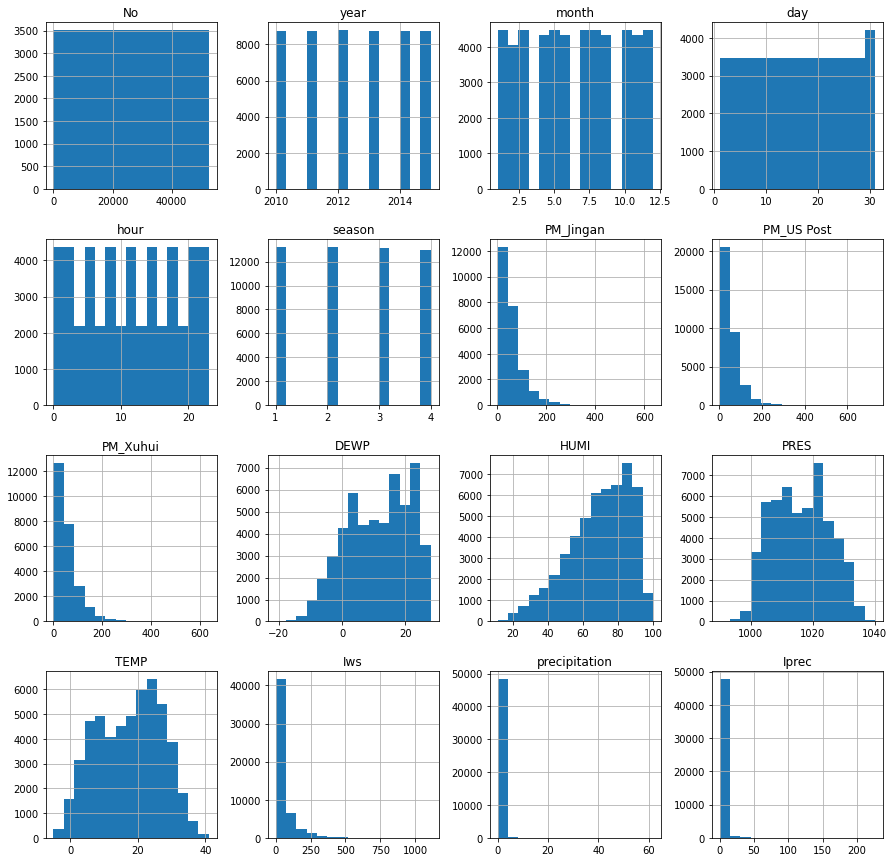

In [14]:
city_dict['shanghai'].hist(bins=15,figsize=(15,15))
plt.show()

Information about Chengdu

In [15]:
city_dict['chengdu'].head()

,No,year,month,day,hour,season,PM_Caotangsi,PM_Shahepu,PM_US Post,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4,NaN,NaN,NaN,4.0,81.20,1022.0,7.0,cv,1.0,0.0,0.0
1,2,2010,1,1,1,4,NaN,NaN,NaN,4.0,86.99,1022.0,6.0,cv,1.0,0.0,0.0
2,3,2010,1,1,2,4,NaN,NaN,NaN,4.0,86.99,1021.0,6.0,cv,1.0,0.0,0.0
3,4,2010,1,1,3,4,NaN,NaN,NaN,3.0,86.89,1021.0,5.0,cv,1.0,0.0,0.0
4,5,2010,1,1,4,4,NaN,NaN,NaN,2.0,86.79,1021.0,4.0,cv,1.0,0.0,0.0


In [16]:
city_dict['chengdu'].describe()

,No,year,month,day,hour,season,PM_Caotangsi,PM_Shahepu,PM_US Post,DEWP,HUMI,PRES,TEMP,Iws,precipitation,Iprec
count,52584.000000,52584.000000,52584.000000,52584.000000,52584.000000,52584.000000,24420.000000,24594.000000,28900.000000,52055.000000,52049.000000,52063.000000,52057.000000,52051.000000,49629.000000,49629.000000
mean,26292.500000,2012.499772,6.523962,15.726609,11.500000,2.491100,77.507002,75.555867,83.407612,12.274556,73.224697,1014.621985,17.698158,4.347654,0.107161,0.591557
std,15179.837614,1.707485,3.448452,8.798896,6.922252,1.116988,60.150955,60.337735,57.239585,7.531846,17.819088,8.111353,7.843607,6.423547,1.023369,5.117582
min,1.000000,2010.000000,1.000000,1.000000,0.000000,1.000000,3.000000,1.000000,1.000000,-16.000000,12.780000,991.000000,-3.000000,0.000000,0.000000,0.000000
25%,13146.750000,2011.000000,4.000000,8.000000,5.750000,1.000000,37.000000,35.000000,44.000000,6.000000,61.440000,1008.000000,11.000000,1.000000,0.000000,0.000000
50%,26292.500000,2012.000000,7.000000,16.000000,11.500000,2.000000,60.000000,57.000000,68.000000,13.000000,77.010000,1014.900000,18.000000,2.000000,0.000000,0.000000
75%,39438.250000,2014.000000,10.000000,23.000000,17.250000,3.000000,99.000000,97.000000,105.000000,19.000000,87.750000,1021.000000,24.000000,5.000000,0.000000,0.000000
max,52584.000000,2015.000000,12.000000,31.000000,23.000000,4.000000,662.000000,573.000000,688.000000,28.000000,100.000000,1041.000000,38.000000,120.000000,57.000000,169.400000


In [17]:
city_dict['chengdu'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52584 entries, 0 to 52583
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   No             52584 non-null  int64  
 1   year           52584 non-null  int64  
 2   month          52584 non-null  int64  
 3   day            52584 non-null  int64  
 4   hour           52584 non-null  int64  
 5   season         52584 non-null  int64  
 6   PM_Caotangsi   24420 non-null  float64
 7   PM_Shahepu     24594 non-null  float64
 8   PM_US Post     28900 non-null  float64
 9   DEWP           52055 non-null  float64
 10  HUMI           52049 non-null  float64
 11  PRES           52063 non-null  float64
 12  TEMP           52057 non-null  float64
 13  cbwd           52063 non-null  object 
 14  Iws            52051 non-null  float64
 15  precipitation  49629 non-null  float64
 16  Iprec          49629 non-null  float64
dtypes: float64(10), int64(6), object(1)
memory usage: 

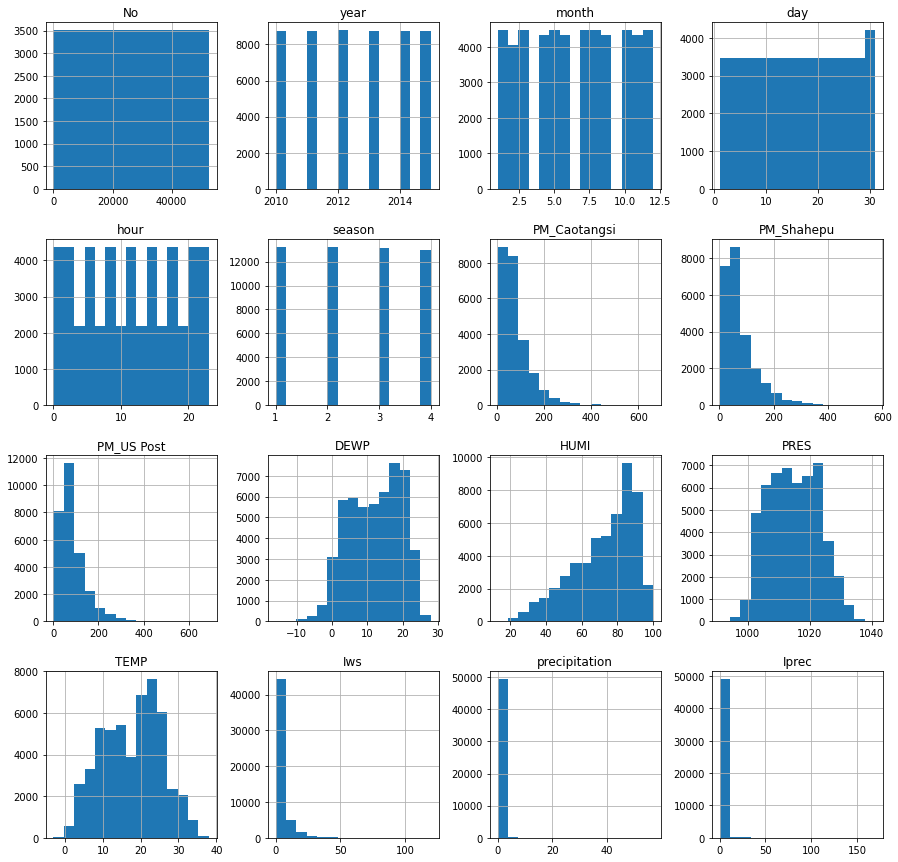

In [18]:
city_dict['chengdu'].hist(bins=15,figsize=(15,15))
plt.show()

Information about Guangzhou

In [19]:
city_dict['guangzhou'].head()

,No,year,month,day,hour,season,PM_City Station,PM_5th Middle School,PM_US Post,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4.0,NaN,NaN,NaN,9.4,76.0,1015.1,13.5,NW,0.8,0.0,0.0
1,2,2010,1,1,1,4.0,NaN,NaN,NaN,10.2,83.0,1015.2,13.0,cv,0.5,0.0,0.0
2,3,2010,1,1,2,4.0,NaN,NaN,NaN,10.4,87.0,1015.0,12.5,NW,0.6,0.3,0.3
3,4,2010,1,1,3,4.0,NaN,NaN,NaN,10.2,89.0,1014.9,12.0,NW,1.4,0.6,0.9
4,5,2010,1,1,4,4.0,NaN,NaN,NaN,10.4,91.0,1014.6,11.8,NE,0.6,0.7,1.6


In [20]:
city_dict['guangzhou'].describe()

,No,year,month,day,hour,season,PM_City Station,PM_5th Middle School,PM_US Post,DEWP,HUMI,PRES,TEMP,Iws,precipitation,Iprec
count,52584.000000,52584.000000,52584.000000,52584.000000,52584.000000,52583.000000,32352.000000,21095.000000,32352.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000
mean,26292.500000,2012.499772,6.523962,15.726609,11.500000,2.491071,50.803938,49.064138,50.803938,16.472691,75.846776,1005.369260,21.996151,7.633037,0.241240,1.086764
std,15179.837614,1.707485,3.448452,8.798896,6.922252,1.116979,36.927474,30.677967,36.927474,87.665141,89.510026,6.917953,6.782722,11.965554,1.941028,7.441679
min,1.000000,2010.000000,1.000000,1.000000,0.000000,1.000000,1.000000,2.000000,1.000000,-9999.000000,-9999.000000,975.000000,1.700000,0.000000,0.000000,0.000000
25%,13146.750000,2011.000000,4.000000,8.000000,5.750000,1.000000,24.000000,28.000000,24.000000,12.400000,66.000000,1000.100000,17.300000,1.800000,0.000000,0.000000
50%,26292.500000,2012.000000,7.000000,16.000000,11.500000,2.000000,43.000000,42.000000,43.000000,19.100000,81.000000,1005.200012,23.500000,3.800000,0.000000,0.000000
75%,39438.250000,2014.000000,10.000000,23.000000,17.250000,3.000000,68.000000,62.000000,68.000000,23.600000,91.000000,1010.600000,26.800000,8.600000,0.000000,0.000000
max,52584.000000,2015.000000,12.000000,31.000000,23.000000,4.000000,526.000000,940.000000,526.000000,27.500000,100.000000,1027.800000,37.400002,214.300000,99.100000,271.900000


In [21]:
city_dict['guangzhou'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52584 entries, 0 to 52583
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   No                    52584 non-null  int64  
 1   year                  52584 non-null  int64  
 2   month                 52584 non-null  int64  
 3   day                   52584 non-null  int64  
 4   hour                  52584 non-null  int64  
 5   season                52583 non-null  float64
 6   PM_City Station       32352 non-null  float64
 7   PM_5th Middle School  21095 non-null  float64
 8   PM_US Post            32352 non-null  float64
 9   DEWP                  52583 non-null  float64
 10  HUMI                  52583 non-null  float64
 11  PRES                  52583 non-null  float64
 12  TEMP                  52583 non-null  float64
 13  cbwd                  52583 non-null  object 
 14  Iws                   52583 non-null  float64
 15  precipitation      

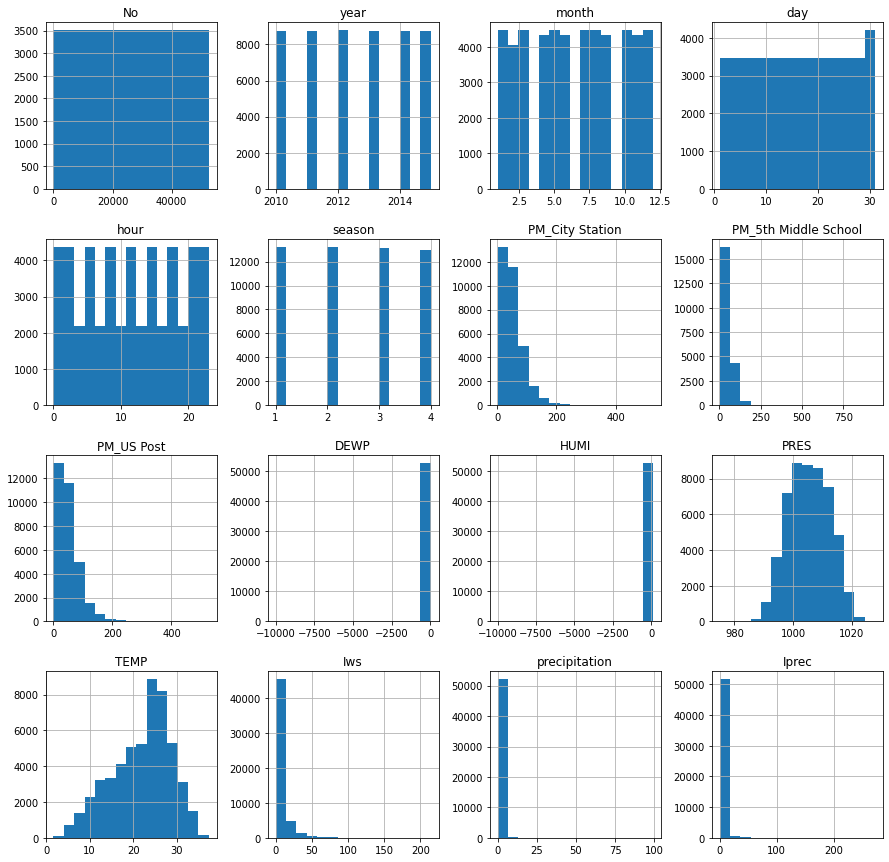

In [22]:
city_dict['guangzhou'].hist(bins=15,figsize=(15,15))
plt.show()

Information about Shenyang

In [23]:
city_dict['shenyang'].head()

,No,year,month,day,hour,season,PM_Taiyuanjie,PM_US Post,PM_Xiaoheyan,DEWP,HUMI,PRES,TEMP,cbwd,Iws,precipitation,Iprec
0,1,2010,1,1,0,4,NaN,NaN,NaN,-26.0,69.79,1024.0,-22.0,NE,1.0289,NaN,NaN
1,2,2010,1,1,1,4,NaN,NaN,NaN,-26.0,76.26,1024.0,-23.0,NE,2.5722,NaN,NaN
2,3,2010,1,1,2,4,NaN,NaN,NaN,-27.0,69.56,1023.0,-23.0,NE,5.1444,NaN,NaN
3,4,2010,1,1,3,4,NaN,NaN,NaN,-27.0,69.56,1023.0,-23.0,NE,7.7166,NaN,NaN
4,5,2010,1,1,4,4,NaN,NaN,NaN,-27.0,69.56,1022.0,-23.0,NE,9.7744,NaN,NaN


In [24]:
city_dict['shenyang'].describe()

,No,year,month,day,hour,season,PM_Taiyuanjie,PM_US Post,PM_Xiaoheyan,DEWP,HUMI,PRES,TEMP,Iws,precipitation,Iprec
count,52584.000000,52584.000000,52584.000000,52584.000000,52584.000000,52584.000000,24388.000000,21680.00000,24627.000000,51892.000000,51904.000000,51892.000000,51892.000000,51892.000000,39821.000000,39821.000000
mean,26292.500000,2012.499772,6.523962,15.726609,11.500000,2.491100,81.189683,75.83750,75.240468,0.850304,63.006561,1016.005492,8.460495,19.816487,0.083895,0.497750
std,15179.837614,1.707485,3.448452,8.798896,6.922252,1.116988,80.112376,68.99593,78.404401,14.261483,21.883355,9.724308,13.948303,32.135270,0.717721,4.360741
min,1.000000,2010.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.00000,2.000000,-97.000000,0.000000,988.000000,-28.000000,0.000000,0.000000,0.000000
25%,13146.750000,2011.000000,4.000000,8.000000,5.750000,1.000000,32.000000,31.00000,28.000000,-11.000000,46.260000,1008.000000,-3.000000,3.000000,0.000000,0.000000
50%,26292.500000,2012.000000,7.000000,16.000000,11.500000,2.000000,59.000000,57.00000,51.000000,1.000000,64.720000,1016.000000,10.000000,8.000000,0.000000,0.000000
75%,39438.250000,2014.000000,10.000000,23.000000,17.250000,3.000000,103.000000,97.00000,93.000000,14.000000,82.010000,1024.000000,21.000000,23.000000,0.000000,0.000000
max,52584.000000,2015.000000,12.000000,31.000000,23.000000,4.000000,1528.000000,932.00000,1361.000000,28.000000,100.000000,1043.000000,35.000000,465.000000,33.100000,120.000000


In [25]:
city_dict['shenyang'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52584 entries, 0 to 52583
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   No             52584 non-null  int64  
 1   year           52584 non-null  int64  
 2   month          52584 non-null  int64  
 3   day            52584 non-null  int64  
 4   hour           52584 non-null  int64  
 5   season         52584 non-null  int64  
 6   PM_Taiyuanjie  24388 non-null  float64
 7   PM_US Post     21680 non-null  float64
 8   PM_Xiaoheyan   24627 non-null  float64
 9   DEWP           51892 non-null  float64
 10  HUMI           51904 non-null  float64
 11  PRES           51892 non-null  float64
 12  TEMP           51892 non-null  float64
 13  cbwd           51892 non-null  object 
 14  Iws            51892 non-null  float64
 15  precipitation  39821 non-null  float64
 16  Iprec          39821 non-null  float64
dtypes: float64(10), int64(6), object(1)
memory usage: 

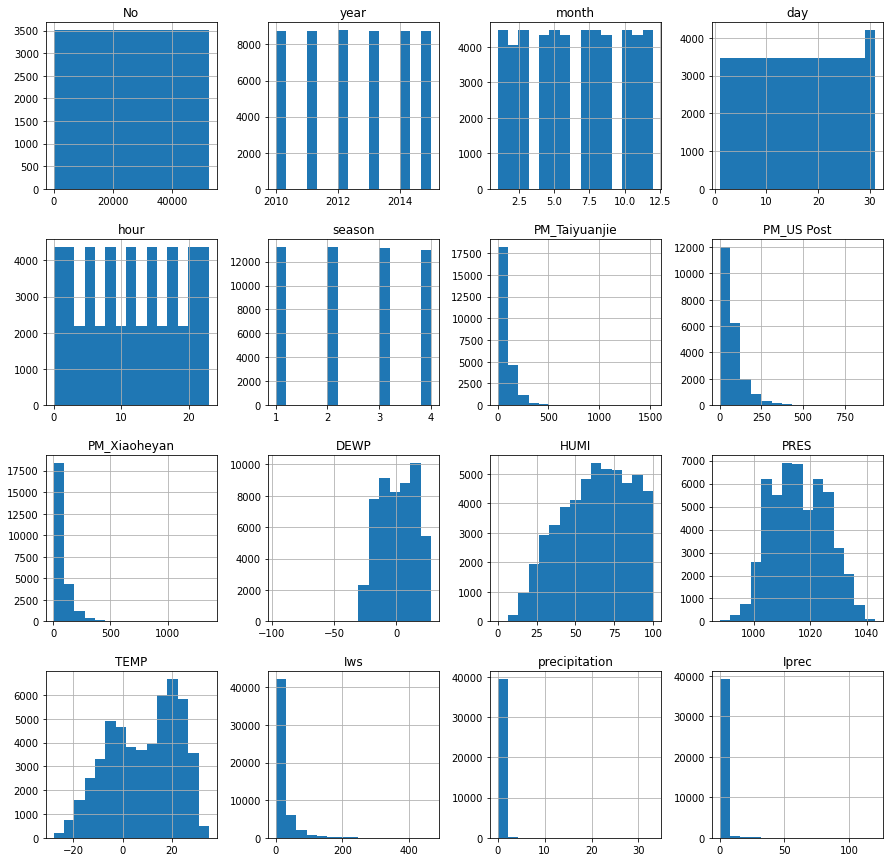

In [26]:
city_dict['shenyang'].hist(bins=15,figsize=(15,15))
plt.show()

Create a column with a date object consisting of year, month, and day

In [27]:
for city, df in city_dict.items():
    city_dict[city]['date'] = pd.to_datetime(city_dict[city][['year', 'month', 'day']])

In [28]:
for city, df in city_dict.items():
    print(city,df.shape)

beijing (52584, 19)
shanghai (52584, 18)
chengdu (52584, 18)
guangzhou (52584, 18)
shenyang (52584, 18)


## Handling Outliers<a id='outliers'></a>

Notice that any precipitation and Iprec value that's above 10000 is most probably an outlier because historically the maximum record in (mm) is around 11000-12000. Hence, outliers from Beijing dataset are removed since it's the only one that exhibits such high values in precipitation and Iprec.

In [29]:
city_dict['beijing'] = city_dict['beijing'][(city_dict['beijing']['precipitation'] < 10000) & 
                                            (city_dict['beijing']['Iprec'] < 10000)]

In [30]:
city_dict['beijing'].describe()

,No,year,month,day,hour,season,PM_Dongsi,PM_Dongsihuan,PM_Nongzhanguan,PM_US Post,DEWP,HUMI,PRES,TEMP,Iws,precipitation,Iprec
count,52099.000000,52099.000000,52099.000000,52099.000000,52099.000000,52099.000000,24571.000000,20190.000000,24465.000000,49913.000000,52094.000000,51765.000000,51765.000000,52094.000000,52094.000000,52099.000000,52099.000000
mean,26083.843452,2012.476977,6.512428,15.705733,11.502351,2.492274,89.116438,92.880783,88.573799,95.964518,2.043921,54.532454,1016.459113,12.572619,23.365081,0.065019,0.325348
std,15092.725293,1.698780,3.449161,8.802003,6.920004,1.116927,87.309285,88.419597,88.045987,91.712668,14.243387,25.977724,10.298656,12.108634,49.449227,0.858786,3.896166
min,1.000000,2010.000000,1.000000,1.000000,0.000000,1.000000,3.000000,3.000000,3.000000,1.000000,-40.000000,2.000000,991.000000,-19.000000,0.450000,0.000000,0.000000
25%,13025.500000,2011.000000,4.000000,8.000000,6.000000,1.000000,24.000000,28.000000,24.000000,27.000000,-10.000000,31.000000,1008.000000,2.000000,1.790000,0.000000,0.000000
50%,26050.000000,2012.000000,7.000000,16.000000,12.000000,2.000000,64.000000,68.000000,62.000000,69.000000,2.000000,55.000000,1016.000000,14.000000,4.920000,0.000000,0.000000
75%,39074.500000,2014.000000,10.000000,23.000000,17.000000,3.000000,124.000000,128.000000,122.000000,133.000000,15.000000,78.000000,1025.000000,23.000000,21.460000,0.000000,0.000000
max,52584.000000,2015.000000,12.000000,31.000000,23.000000,4.000000,737.000000,672.000000,844.000000,994.000000,28.000000,100.000000,1046.000000,42.000000,585.600000,69.200000,223.000000


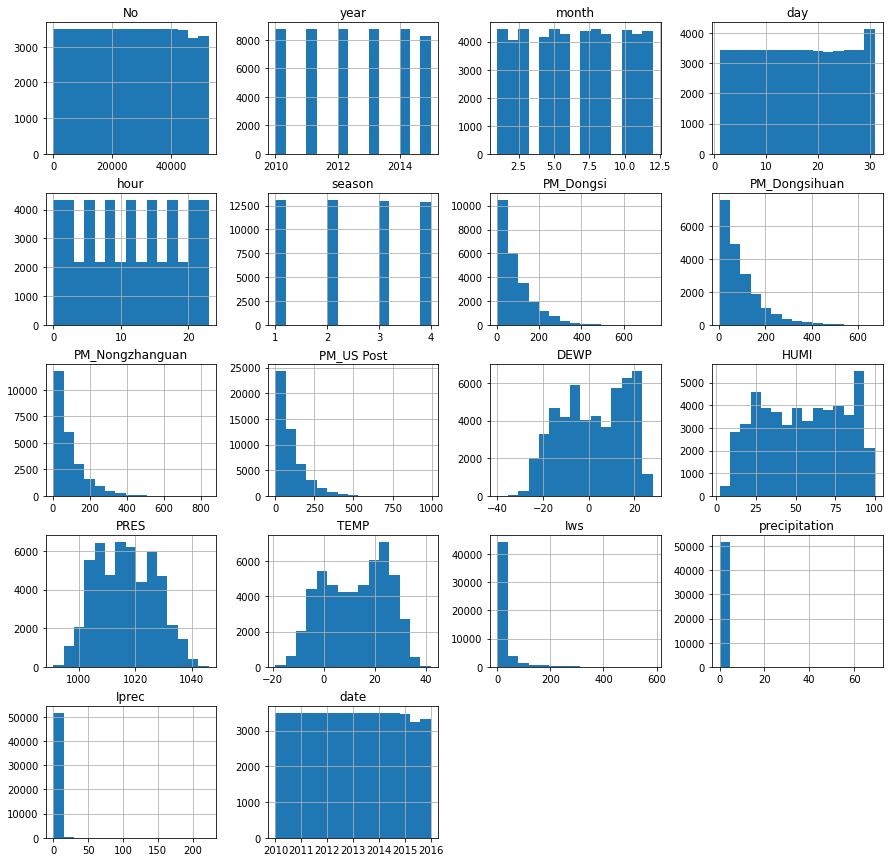

In [31]:
city_dict['beijing'].hist(bins=15,figsize=(15,15))
plt.show()

Humidity is a percentage. It cannot be negative. Hence, outliers with negative values from Gaungzhou dataset are removed since it's the only one that exhibits negative values in humidty.

In [32]:
city_dict['guangzhou'] = city_dict['guangzhou'][city_dict['guangzhou']['HUMI'] >= 0]

The lowest dew point ever observed on earth is around -90 Celsius. Hence, outliers with values lower than -100 Celsius from Guangzhou dataset are removed since it's the only one that exhibits such large negative values in DEWP. 

In [33]:
city_dict['guangzhou'] = city_dict['guangzhou'][city_dict['guangzhou']['DEWP'] >= -100]

In [34]:
city_dict['guangzhou'].describe()

,No,year,month,day,hour,season,PM_City Station,PM_5th Middle School,PM_US Post,DEWP,HUMI,PRES,TEMP,Iws,precipitation,Iprec
count,52579.000000,52579.000000,52579.000000,52579.000000,52579.000000,52579.000000,32347.000000,21095.000000,32347.000000,52579.000000,52579.000000,52579.000000,52579.000000,52579.000000,52579.000000,52579.000000
mean,26291.365032,2012.499686,6.523441,15.726450,11.500238,2.490956,50.802455,49.064138,50.802455,17.234628,76.613230,1005.368822,21.996847,7.632490,0.241222,1.086464
std,15179.951759,1.707526,3.448203,8.799049,6.922195,1.116944,36.929976,30.677967,36.929976,7.340012,17.029764,6.918034,6.782511,11.965823,1.941100,7.441882
min,1.000000,2010.000000,1.000000,1.000000,0.000000,1.000000,1.000000,2.000000,1.000000,-11.700000,12.000000,975.000000,1.700000,0.000000,0.000000,0.000000
25%,13145.500000,2011.000000,4.000000,8.000000,6.000000,1.000000,24.000000,28.000000,24.000000,12.400000,66.000000,1000.100000,17.300000,1.800000,0.000000,0.000000
50%,26290.000000,2012.000000,7.000000,16.000000,12.000000,2.000000,43.000000,42.000000,43.000000,19.200000,81.000000,1005.200012,23.500000,3.800000,0.000000,0.000000
75%,39438.500000,2014.000000,10.000000,23.000000,17.500000,3.000000,68.000000,62.000000,68.000000,23.600000,91.000000,1010.600000,26.800000,8.600000,0.000000,0.000000
max,52583.000000,2015.000000,12.000000,31.000000,23.000000,4.000000,526.000000,940.000000,526.000000,27.500000,100.000000,1027.800000,37.400002,214.300000,99.100000,271.900000


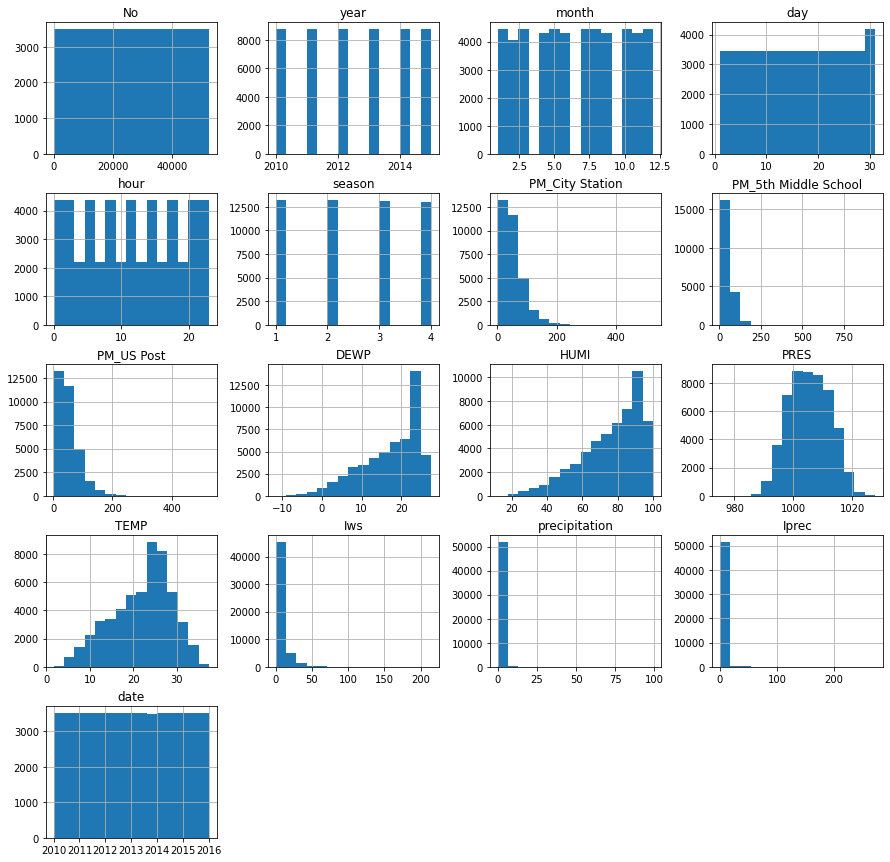

In [35]:
city_dict['guangzhou'].hist(bins=15,figsize=(15,15))
plt.show()

## Feature Engineering  <a id='feature_eng'></a>

<ol>
    <li> Averaging hours:  PM levels were averaged for each day by averaging over $24$ hours for each station. For example, the Shanghai dataset has three stations: `PM_Jingan`,`PM_US Post`, and `PM_Xuhui`. So, PM levels were averaged in each station, and the average PM level for each station for each day was obtained. Hence, in total there are $3$ PM values from each station for each day. The hours rows for DEWP, HUMI, PRES, TEMP, lws, and precipitation for each city were also averaged in the same fashion.</li>
    <p> </p>
    <li> Averaging stations: PM levels were averaged that are reported from the group of stations for each day (which is obtained from the previous step because we averaged over $24$ hours for each station).</li>
    <p> Hence, there is a new column, called "PM_avg", after averaging both stations and hours where each row encodes the daily PM level for a city. Creating this coarse-grained model avoids the problem of missing data at the hourly level, and makes analyzing this dataset simpler. </p>
    <p> </p>
    <li> After removing missing values and performing data split, in model.ipynb a new column called "count_greater_than_PM_high" was created, which counts the number of days that are greater than PM_high for the next $30$ days. This column is going to be the label column, and the some of the rest of the columns are going to be features that are going to be useed to predict "count_greater_than_PM_high"; thereby setting the problem as a supervised learning regression problem. </li>
</ol>

In [36]:
city_dict_avg = copy.deepcopy(city_dict)

Average over $24$ hours, then average over stations

In [37]:
city_dict_avg = utils.averaging(city_dict_avg)

Note that the interpretation of the columns are different now after performing these averages especialy
for precipitation and Iprec features.

year: year of data in this row. \
month: month of data in this row. \
day: day of data in this row.\
season: season of data in this row.\
PMAvg: PM2.5 concentration (ug/m^3).\
DEWP: Dew Point (Celsius Degree). \
TEMP: Temperature (Celsius Degree).\
HUMI: Humidity (%).\
PRES: Pressure (hPa).\
Iws: Cumulated wind speed (m/s).\
precipitation: average hourly precipitation for one day(mm).\
Iprec: average cumulated precipitation for on day (mm).


In [38]:
for city,df in city_dict_avg.items():
    print(city)
    df.info()

beijing
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2183 entries, 0 to 2182
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   year           2183 non-null   int64         
 1   month          2183 non-null   int64         
 2   day            2183 non-null   int64         
 3   season         2183 non-null   float64       
 4   DEWP           2183 non-null   float64       
 5   HUMI           2172 non-null   float64       
 6   PRES           2172 non-null   float64       
 7   TEMP           2183 non-null   float64       
 8   Iws            2183 non-null   float64       
 9   precipitation  2183 non-null   float64       
 10  Iprec          2183 non-null   float64       
 11  PM_avg         2147 non-null   float64       
 12  date           2183 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(9), int64(3)
memory usage: 221.8 KB
shanghai
<class 'pandas.core.frame.DataFrame'>
Ra

## Remove Missing Values<a id='missing_values'></a>

In [39]:
city_dict_no_na = copy.deepcopy(city_dict_avg)

In [40]:
for city,df in city_dict_avg.items():
    temp_df = city_dict_no_na[city][city_dict_no_na[city].notna()]
    city_dict_no_na[city] = temp_df.dropna()

It was decided to delete missing values for two reasons:
<ol>   
    <li> For cities like Shenyang, most of the missing data occurs in big contiguous bulks that occurred in the beginning of the dataset. Hence, imputing such big bulks is not a good strategy. </li>
    <li> When some other missing data doesn't occur in big contiguous bulks, i.e. sparse, they constituted a very small percentage of the dataset. </li>
</ol>

Check the dimensions after deleting missing values

In [41]:
for city,df in city_dict_no_na.items():
    print(city)
    df.info()

beijing
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2136 entries, 0 to 2182
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   year           2136 non-null   int64         
 1   month          2136 non-null   int64         
 2   day            2136 non-null   int64         
 3   season         2136 non-null   float64       
 4   DEWP           2136 non-null   float64       
 5   HUMI           2136 non-null   float64       
 6   PRES           2136 non-null   float64       
 7   TEMP           2136 non-null   float64       
 8   Iws            2136 non-null   float64       
 9   precipitation  2136 non-null   float64       
 10  Iprec          2136 non-null   float64       
 11  PM_avg         2136 non-null   float64       
 12  date           2136 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(9), int64(3)
memory usage: 233.6 KB
shanghai
<class 'pandas.core.frame.DataFrame'>
In

## Averaging Process Validation<a id='avg_validation'></a>

By comparing the histograms below to the histograms plotted above, the datasets histograms after averaging and removing missing data have almost the same distribution shapes as the original datasets histograms. Moreover, the time series after the data preprocessing phase seems to capture the same evolution as the original time series as shown in the plots below too. Hence, the averaging process for all features seems to be a good approximation.

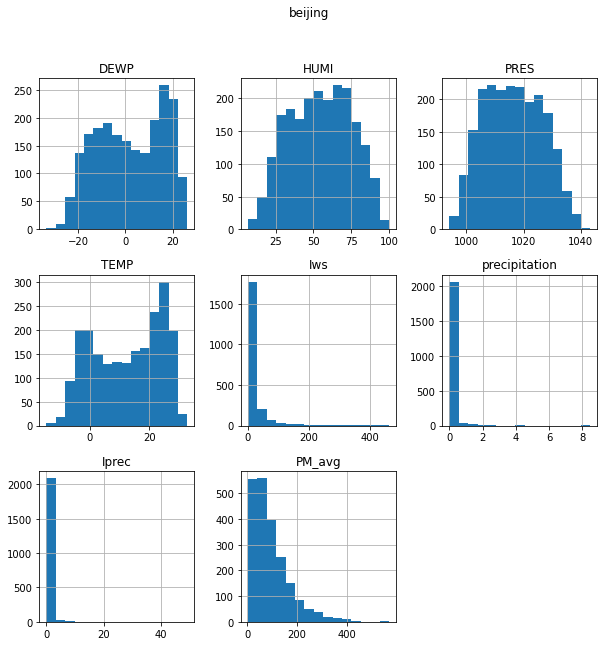

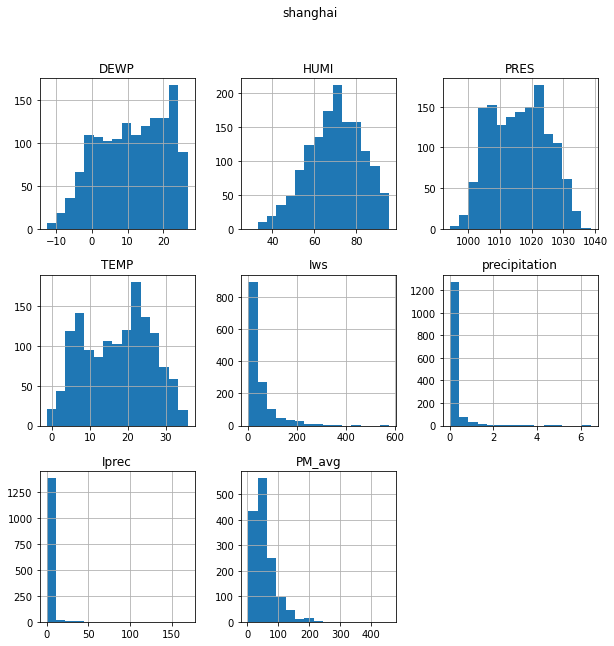

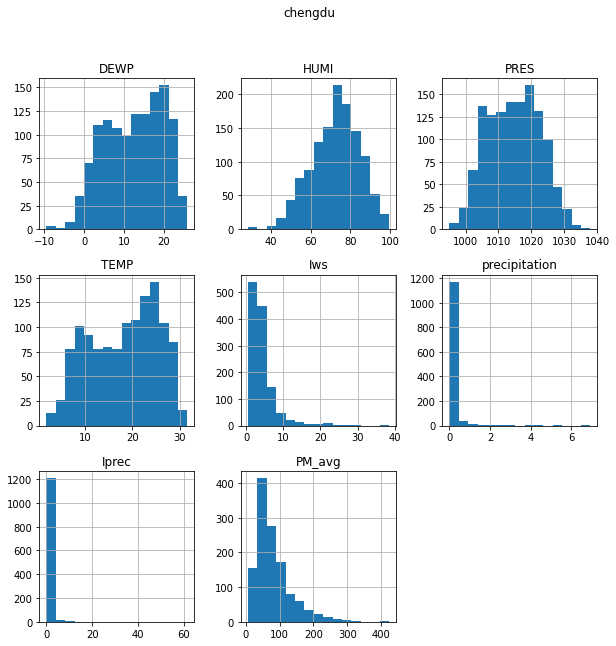

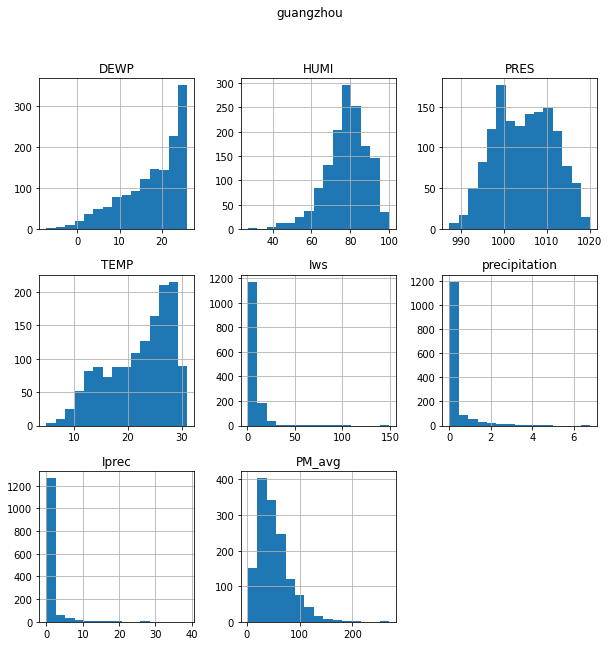

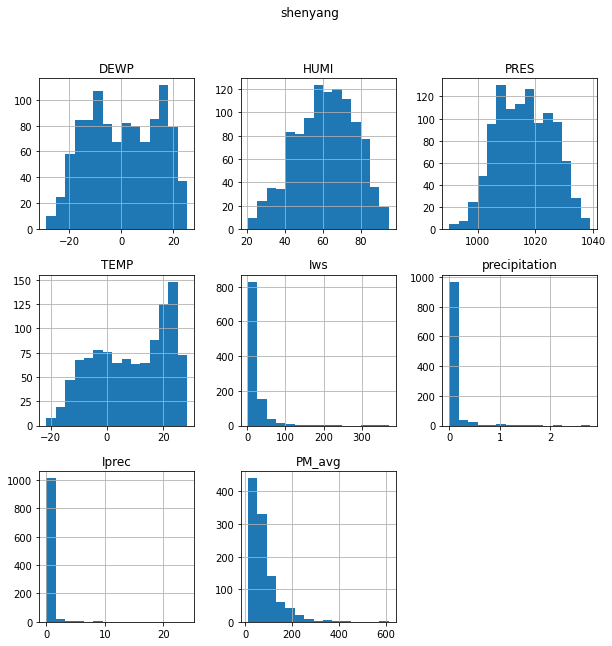

In [42]:
for city,df in city_dict_no_na.items():
    axes = df.hist(column=['DEWP','HUMI','PRES','TEMP','Iws','precipitation','Iprec','PM_avg'],bins=15,figsize=(10,10))
    plt.suptitle(city)
plt.show()

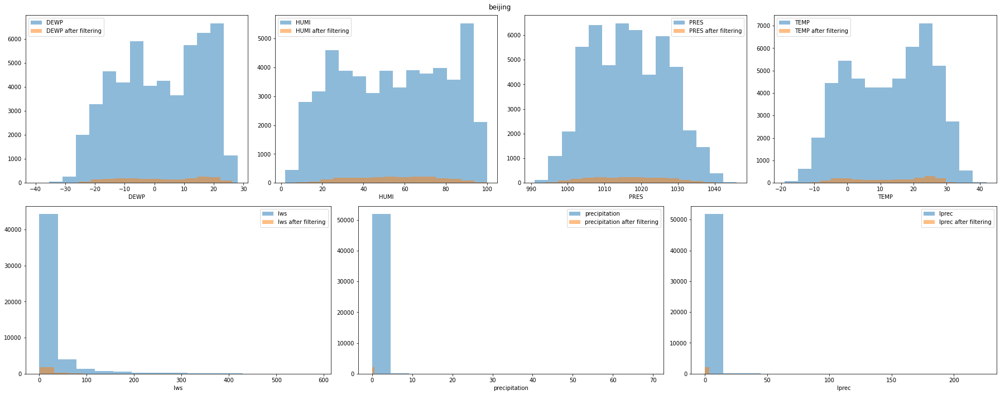

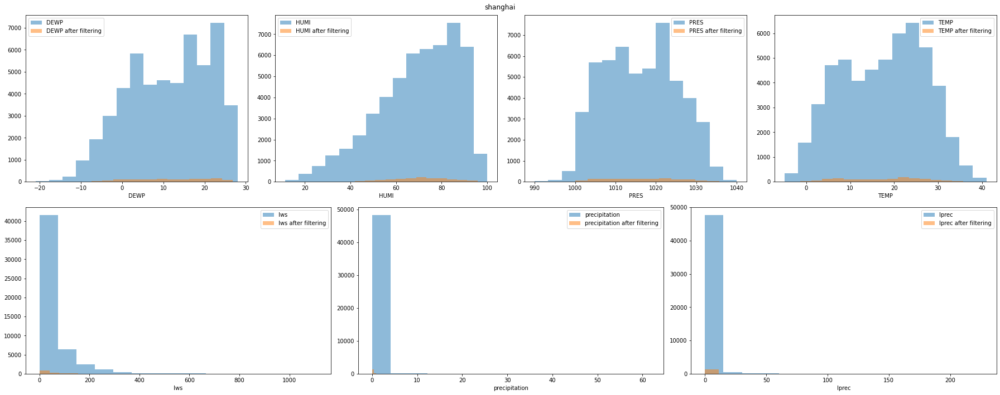

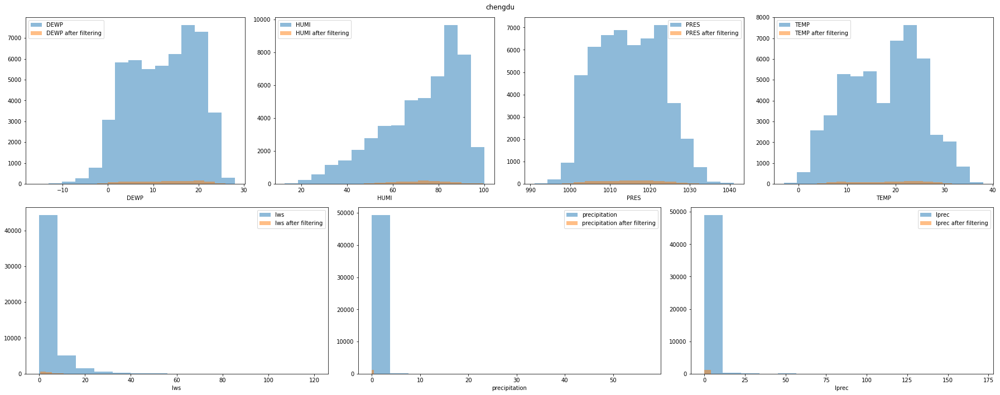

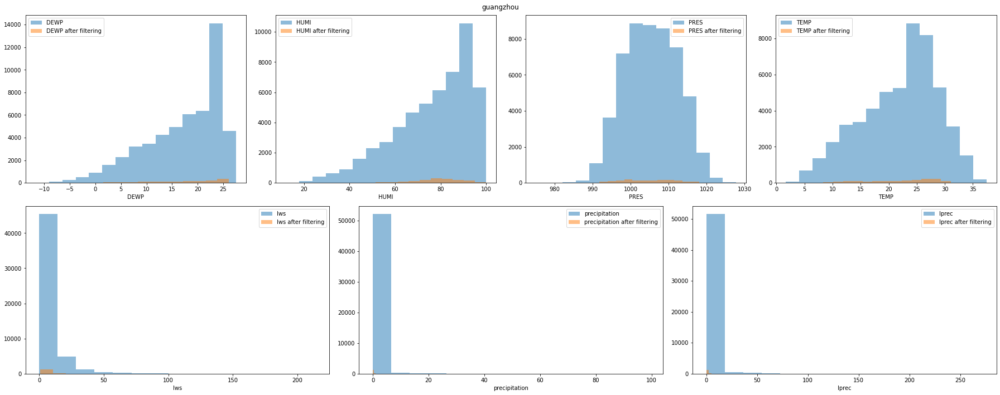

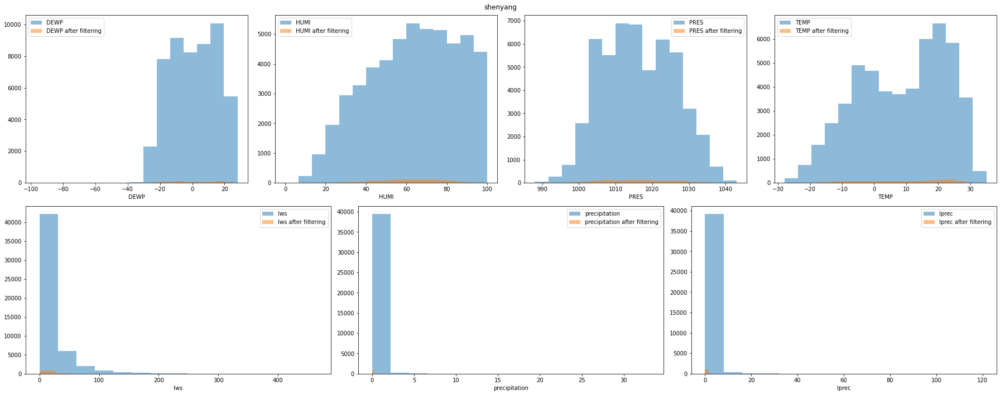

In [43]:
relevant_features = ['DEWP','HUMI','PRES','TEMP','Iws','precipitation','Iprec']
utils.plot_city_features_histograms(city_dict,city_dict_no_na,relevant_features)

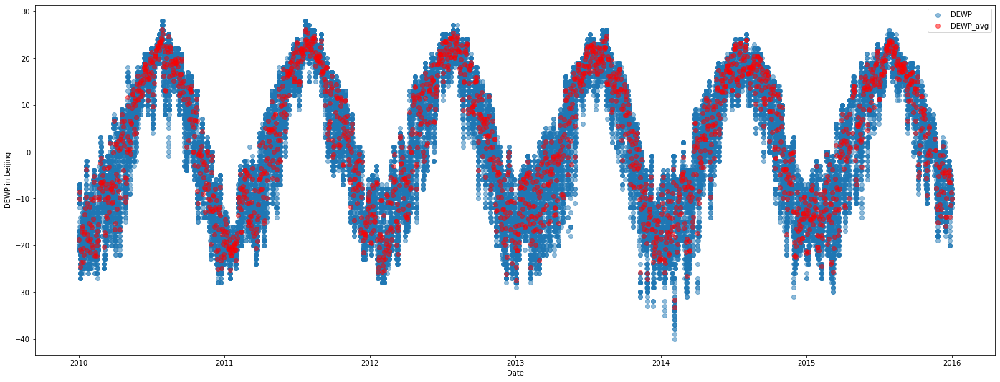

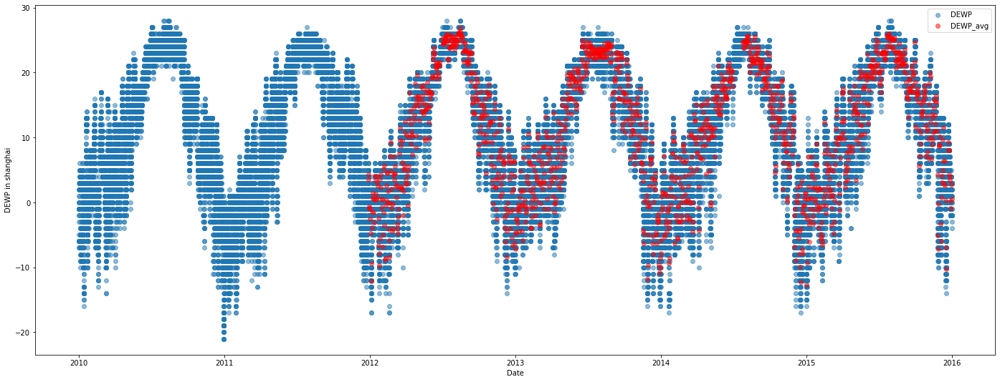

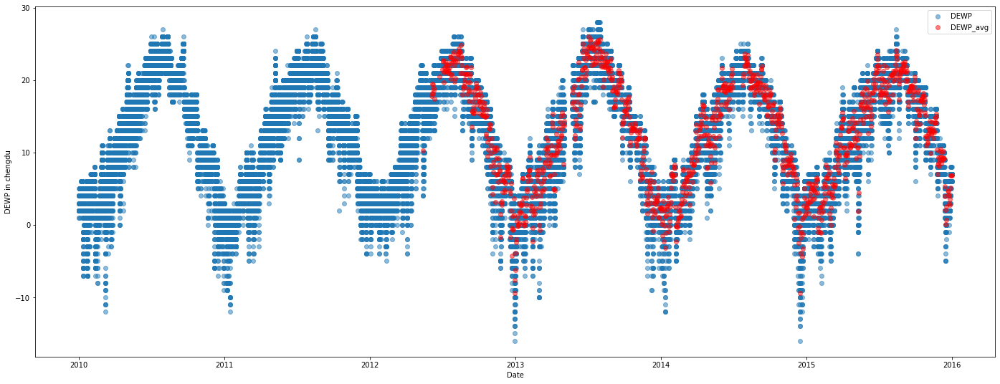

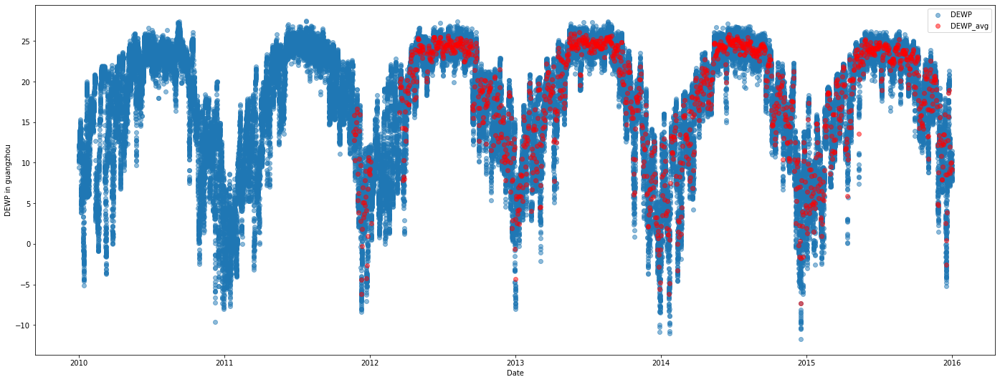

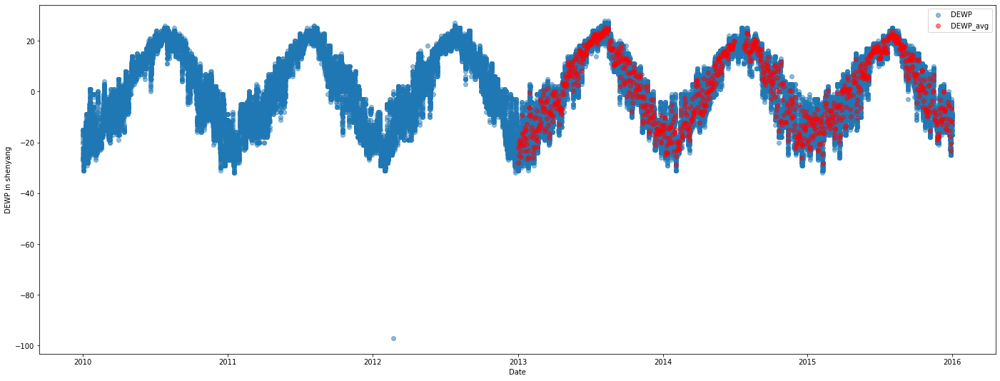

...

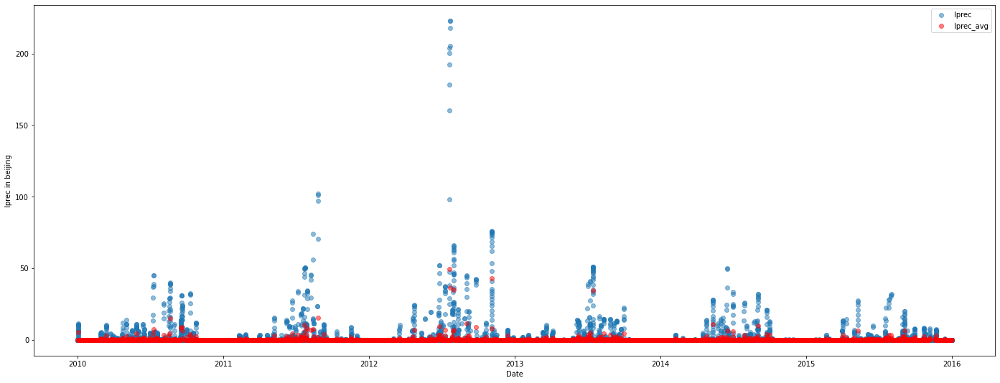

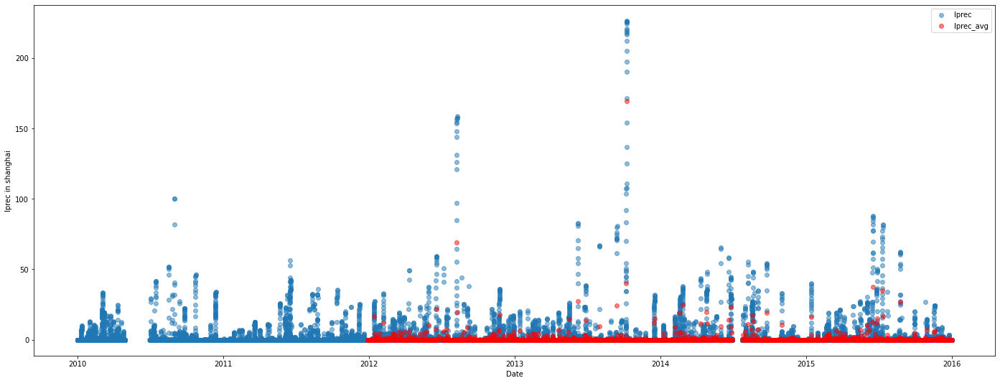

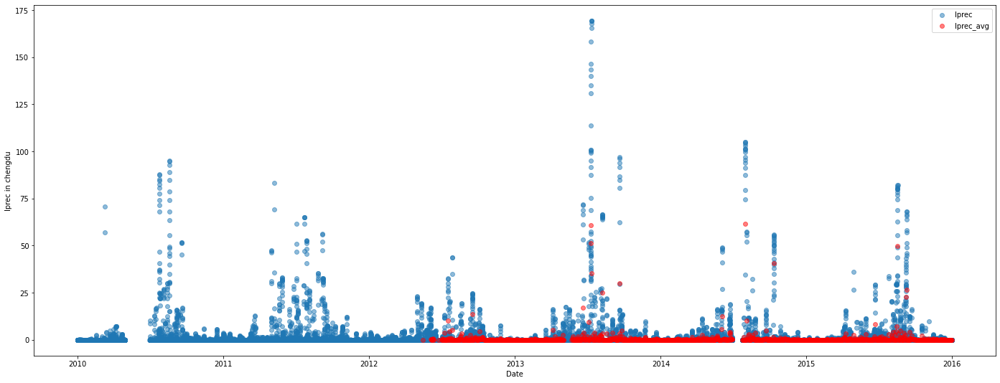

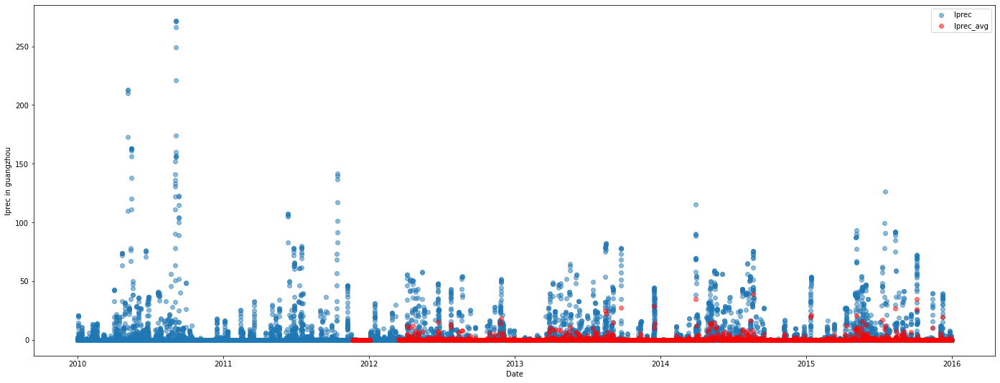

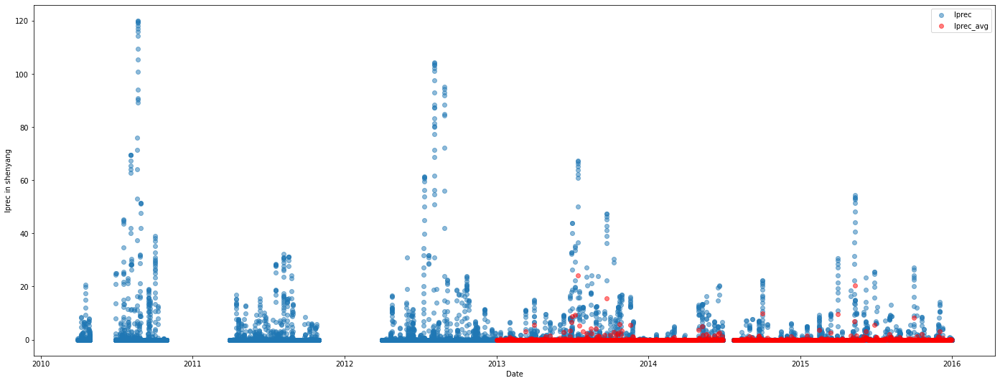

In [44]:
for feature in ['DEWP','HUMI','PRES','TEMP','Iws','precipitation','Iprec']:
    for city in city_dict.keys():
        plt.figure(figsize=(24,9))
        plt.scatter(city_dict[city]['date'], city_dict[city][feature],label=feature, alpha=0.5)
        plt.scatter(city_dict_no_na[city]['date'], city_dict_no_na[city][feature],label=feature+"_avg",marker='o',color='red',alpha=0.5)
        plt.ylabel(feature + " in " + city)
        plt.xlabel("Date")
        plt.legend()
        plt.show()

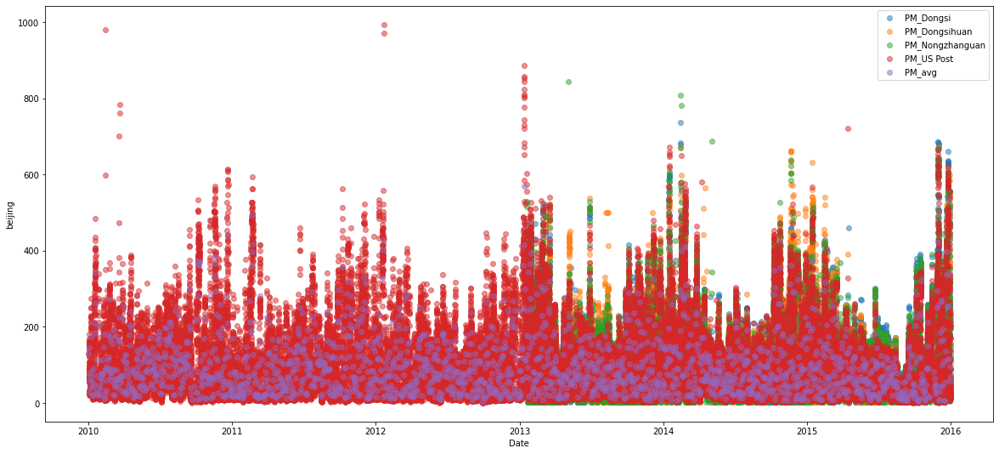

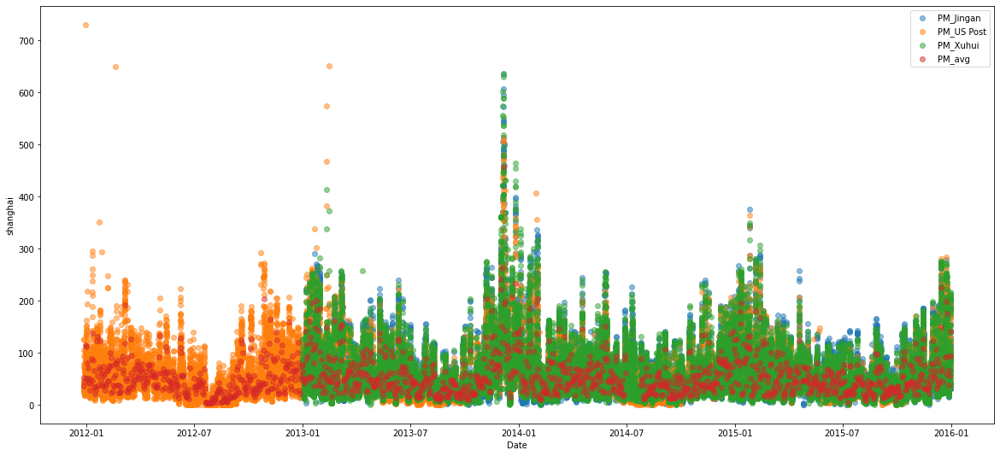

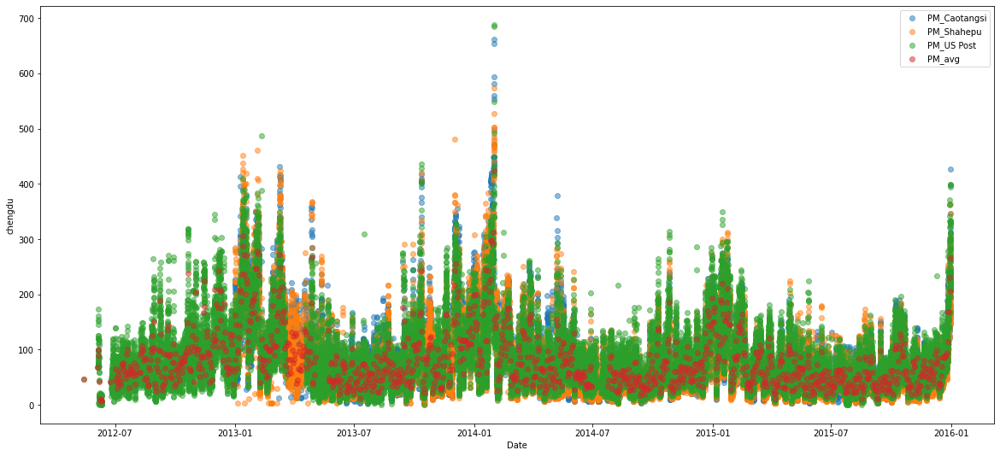

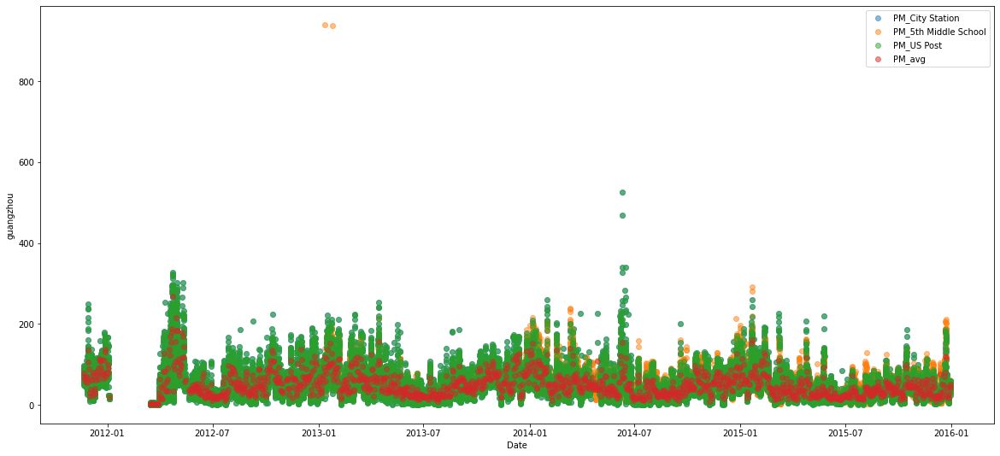

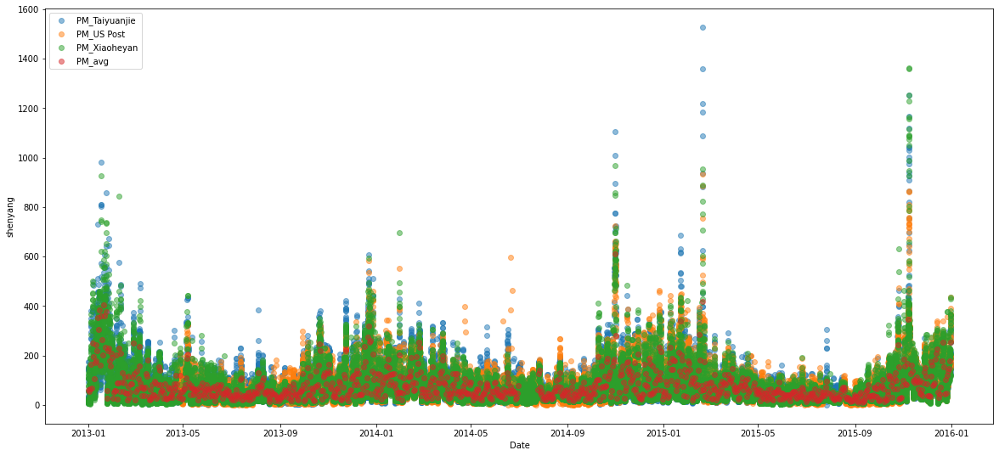

In [45]:
for city in city_dict.keys():
    stations = [col for col in city_dict[city] if col.startswith('PM')] 
    plt.figure(figsize=(20,9))
    for station in stations:
        plt.scatter(city_dict[city]['date'], city_dict[city][station],label=station,alpha=0.5)
    
    plt.scatter(city_dict_no_na[city]['date'], city_dict_no_na[city]['PM_avg'],label='PM_avg',alpha=0.5)
    plt.ylabel(city)
    plt.xlabel("Date")
    plt.legend()
    plt.show()

## Save Data<a id='save_data'></a>

In [46]:
if not os.path.exists(os.path.join(DIRECTORY_INTER,CITY_DICT_NO_NA_FILENAME)):
    with open(os.path.join(DIRECTORY_INTER,CITY_DICT_NO_NA_FILENAME), 'wb') as handle:
        pickle.dump(city_dict_no_na, handle, protocol=pickle.HIGHEST_PROTOCOL)